In [1]:
import scvelo as scv
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import decoupler as dc
import os, tqdm
import harmonypy as hm
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import csv
from gtfparse import read_gtf
import hdf5plugin
import seaborn as sns
import seaborn.objects as so
import scanpy.external as sce
from scipy.sparse import coo_matrix
from bioinfokit import analys, visuz
from sanbomics.plots import volcano
from adjustText import adjust_text
import leidenalg
import gseapy as gp
from gseapy import barplot, dotplot
import decoupler
from scipy import io
import tempfile
import torch
from rich import print
from scib_metrics.benchmark import Benchmarker
import celltypist
from celltypist import models
import scBalance.scbalance_IO as ss
import scBalance as sb
from matplotlib import rcParams
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
from scipy.sparse import csr_matrix

## Celltypist_model - Human_Lung_celltype

In [2]:
adata_fetal_final=sc.read_h5ad('./../Candeli_2025/data/Conchola2023/Conchola2023_FetalEpithelium_processed.h5ad')
adata_fetal_final.obs['Technique']='10x'
adata_fetal_final.obs['Reference']= 'Conchola et al., (2023)'
adata_fetal_final.X=adata_fetal_final.layers['counts'].copy()
adata_fetal_final

AnnData object with n_obs × n_vars = 10614 × 24373
    obs: 'Patient ID', 'annotation', 'Tissue', 'Region', 'Time point', 'Technique', 'Reference', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'gencode_og_name', 'gencode_og_id', 'gencode_v44_name', 'summed_genes', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'rp', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Reference_colors', 'hvg', 'log1p'
    layers: 'counts', 'scaled'

In [3]:
categories=adata_fetal_final.obs['annotation'].unique()

category_mapping = {
    'Multiciliated Precursor': 'Multiciliated',
    'Neuroendocrine': 'PNEC',

}

# Apply the mapping to the 'annotation' column
adata_fetal_final.obs['annotation'] = adata_fetal_final.obs['annotation'].replace(category_mapping)

# If the column is categorical, you might need to update the categories
if adata_fetal_final.obs['annotation'].dtype.name == 'category':
    adata_fetal_final.obs['annotation'].cat.categories = adata_fetal_final.obs['annotation'].cat.categories.map(lambda x: category_mapping.get(x, x))

categories=adata_fetal_final.obs['annotation'].unique()
for category in categories:
    print(category)

Basal

Lower Airway Progenitor

Multiciliated

Goblet-like Secretory

PNEC

Club-like Secretory

Bud Tip Adjacent

Bud Tip Progenitor

Unknown

In [4]:
guo_adata = sc.read_h5ad('./data/Guo2023/Guo2023_AdultLung_processed.h5ad')
guo_adata.X = guo_adata.layers['counts'].copy()
del guo_adata.layers
del guo_adata.raw

guo_adata

AnnData object with n_obs × n_vars = 135863 × 32284
    obs: 'Sample ID', 'Patient ID', 'Dataset', 'Age', 'Sex', 'lineage_level1', 'lineage_level2', 'celltype_level1', 'celltype_level2', 'annotation', 'celltype_level3_fullname', 'Lung-Region', 'Reference', 'Tissue', 'Technique', 'Time point', 'Region', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'features', 'gencode_og_name', 'gencode_og_id', 'gencode_v44_name', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'rp', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Dataset_colors', 'Lung-Region_colors', 'Reference_colors', 'Region_colors', 'annotation_colors', 'celltype_level3_colors', 'hvg', 'lineage_level1_colors', 'log1p'
    obsm: 'X_pca', 'X_umap'

In [5]:
for cat in guo_adata.obs['annotation'].unique():
    print(cat)

Serous

Mucous

SMG Basal/Duct

Goblet

MEC

Secretory

Ionocyte

Ciliated

Suprabasal

Basal

AT2

Deuterosomal

Tuft

PNEC

AT1

RAS

In [6]:
category_mapping = {
    'Ciliated': 'Multiciliated'
}

# Apply the mapping to the 'annotation' column
guo_adata.obs['annotation'] = guo_adata.obs['annotation'].replace(category_mapping)

# If the column is categorical, you might need to update the categories
if adata_fetal_final.obs['annotation'].dtype.name == 'category':
    adata_fetal_final.obs['annotation'].cat.categories = adata_fetal_final.obs['annotation'].cat.categories.map(lambda x: category_mapping.get(x, x))

categories=adata_fetal_final.obs['annotation'].unique()
for category in categories:
    print(category)

Basal

Lower Airway Progenitor

Multiciliated

Goblet-like Secretory

PNEC

Club-like Secretory

Bud Tip Adjacent

Bud Tip Progenitor

Unknown

In [7]:
merged = ad.concat([adata_fetal_final,guo_adata],join='outer',axis=0,fill_value=0)

In [8]:
merged.write_h5ad('./../Candeli_2025/data/Celltypist/Human_Lung_Epithelium.h5ad',
    compression=hdf5plugin.FILTERS["zstd"],
    compression_opts=hdf5plugin.Zstd(clevel=5).filter_options
)
del merged

... storing 'Technique' as categorical


... storing 'Reference' as categorical


In [9]:
adata_lung=sc.read_h5ad('./data/Celltypist/Human_Lung_Epithelium.h5ad')
adata_lung

AnnData object with n_obs × n_vars = 146477 × 37595
    obs: 'Patient ID', 'annotation', 'Tissue', 'Region', 'Time point', 'Technique', 'Reference', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'Sample ID', 'Dataset', 'Age', 'Sex', 'lineage_level1', 'lineage_level2', 'celltype_level1', 'celltype_level2', 'celltype_level3_fullname', 'Lung-Region'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'scaled'

In [12]:
#Normalize counts per cell.
#Normalize each cell by total counts over all genes, so that every cell has the same total count after normalization
sc.pp.normalize_total(adata_lung, target_sum=1e4)
#Logarithmize the data matrix.
#Computes X = log (X=1), where X denotes the natural logarithm unless a different base is given.
sc.pp.log1p(adata_lung)

In [13]:
adata_lung.raw=adata_lung
adata_lung.raw.X

<146477x37595 sparse matrix of type '<class 'numpy.float64'>'
	with 402786343 stored elements in Compressed Sparse Row format>

In [12]:
# The labels in `.obs` will be used as cell type labels for training.
new_model = celltypist.train(adata_lung, labels = 'annotation', max_iter=10000, n_jobs = 10, feature_selection = True)

INFO:celltypist.logger:🍳 Preparing data before training


INFO:celltypist.logger:✂️ 2252 non-expressed genes are filtered out


INFO:celltypist.logger:🔬 Input data has 146477 cells and 35343 genes


INFO:celltypist.logger:⚖️ Scaling input data


INFO:celltypist.logger:🏋️ Training data using SGD logistic regression


INFO:celltypist.logger:🔎 Selecting features


INFO:celltypist.logger:🧬 3090 features are selected


INFO:celltypist.logger:🏋️ Starting the second round of training


INFO:celltypist.logger:🏋️ Training data using logistic regression


INFO:celltypist.logger:✅ Model training done!


In [13]:
# Save the model
new_model.write('./data/Celltypist/celltypist_costum_models/Human_Lung_celltype.pkl')

In [10]:
# Any model can be inspected.
model = models.Model.load(model = './data/Celltypist/celltypist_costum_models/Human_Lung_celltype.pkl')
model.cell_types

array(['AT1', 'AT2', 'Basal', 'Bud Tip Adjacent', 'Bud Tip Progenitor',
       'Club-like Secretory', 'Deuterosomal', 'Goblet',
       'Goblet-like Secretory', 'Ionocyte', 'Lower Airway Progenitor',
       'MEC', 'Mucous', 'Multiciliated', 'PNEC', 'RAS', 'SMG Basal/Duct',
       'Secretory', 'Serous', 'Suprabasal', 'Tuft', 'Unknown'],
      dtype=object)

In [14]:
markers_dict = {}
for celltype in model.cell_types:
    markers = model.extract_top_markers(celltype, 100)
    markers = [marker for marker in markers if marker in adata_lung.raw.var_names]
    markers_dict[celltype] = markers[:10]
markers_dict

{'AT1': ['RTKN2',
  'NCKAP5',
  'SLC39A8',
  'GPM6A',
  'CLDN18',
  'ARHGEF26',
  'ROR1',
  'CLIC5',
  'MAP2',
  'IL32'],
 'AT2': ['LAMP3',
  'SFTPA1',
  'SFTPD',
  'ABCA3',
  'SFTPA2',
  'LRRK2',
  'SFTPC',
  'SERPINA1',
  'LPCAT1',
  'FASN'],
 'Basal': ['KRT15',
  'MMP10',
  'SERPINF1',
  'BCAM',
  'KRT17',
  'MIR205HG',
  'IGF2',
  'TP63',
  'LSP1P1',
  'DLK2'],
 'Bud Tip Adjacent': ['SFTA3',
  'C19orf33',
  'H3-3A',
  'HSPB1',
  'GDF15',
  'CLDN6',
  'TNNC1',
  'STMN1',
  'MT-ND5',
  'SMARCA5'],
 'Bud Tip Progenitor': ['TPPP3',
  'TESC',
  'NPC2',
  'SFTPC',
  'CA2',
  'IGFBP7',
  'CLU',
  'CLDN2',
  'ETV5',
  'PIK3C2G'],
 'Club-like Secretory': ['TFF3',
  'PLAC8',
  'MSLN',
  'RHOV',
  'GPX1',
  'CFD',
  'CYP2F1',
  'GADD45B',
  'TCN1',
  'GUCA1A'],
 'Deuterosomal': ['CDC20B',
  'SHISA8',
  'DEUP1',
  'AL021807.1',
  'BICDL3P',
  'APELA',
  'FOXN4',
  'AP003121.1',
  'C11orf88',
  'ZMYND10'],
 'Goblet': ['BPIFB1',
  'PIGR',
  'PRSS23',
  'PSCA',
  'MS4A8',
  'MUC5AC',
  'SERPINB3'

AT1 : 
['RTKN2', 'NCKAP5', 'SLC39A8', 'GPM6A', 'CLDN18', 'ARHGEF26', 'ROR1', 'CLIC5', 'MAP2', 'IL32']

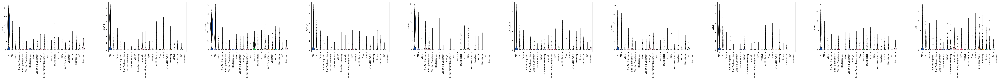

AT2 : 
['LAMP3', 'SFTPA1', 'SFTPD', 'ABCA3', 'SFTPA2', 'LRRK2', 'SFTPC', 'SERPINA1', 'LPCAT1', 'FASN']

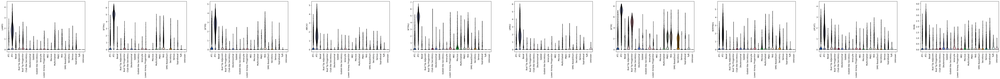

Basal : 
['KRT15', 'MMP10', 'SERPINF1', 'BCAM', 'KRT17', 'MIR205HG', 'IGF2', 'TP63', 'LSP1P1', 'DLK2']

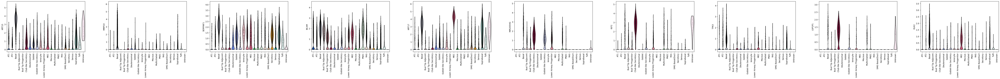

Bud Tip Adjacent : 
['SFTA3', 'C19orf33', 'H3-3A', 'HSPB1', 'GDF15', 'CLDN6', 'TNNC1', 'STMN1', 'MT-ND5', 'SMARCA5']

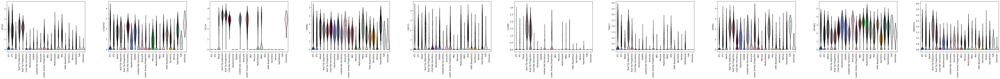

Bud Tip Progenitor : 
['TPPP3', 'TESC', 'NPC2', 'SFTPC', 'CA2', 'IGFBP7', 'CLU', 'CLDN2', 'ETV5', 'PIK3C2G']

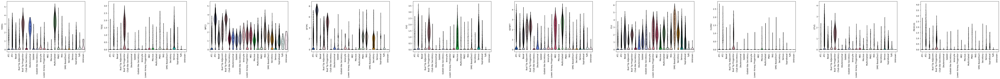

Club-like Secretory : 
['TFF3', 'PLAC8', 'MSLN', 'RHOV', 'GPX1', 'CFD', 'CYP2F1', 'GADD45B', 'TCN1', 'GUCA1A']

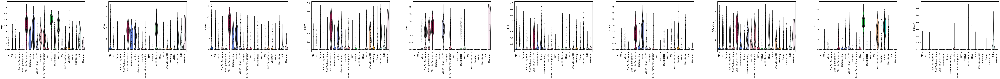

Deuterosomal : 
['CDC20B', 'SHISA8', 'DEUP1', 'AL021807.1', 'BICDL3P', 'APELA', 'FOXN4', 'AP003121.1', 'C11orf88', 'ZMYND10']

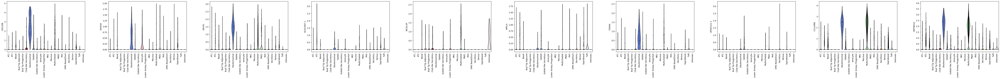

Goblet : 
['BPIFB1', 'PIGR', 'PRSS23', 'PSCA', 'MS4A8', 'MUC5AC', 'SERPINB3', 'VMO1', 'SCGB2A1', 'CFD']

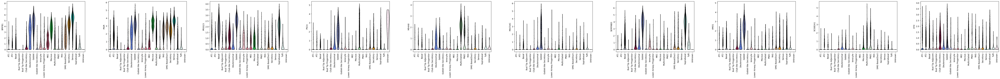

Goblet-like Secretory : 
['SCGB3A1', 'TTYH1', 'H3-3B', 'SLPI', 'CALML5', 'TM4SF1', 'COL9A3', 'MIA', 'TSPAN8', 'APIP']

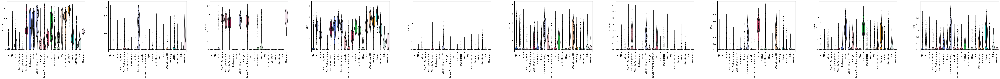

Ionocyte : 
['ASCL3', 'BSND', 'CLDN25', 'LINC01187', 'LINC00706', 'STAP1', 'NXPH2', 'ATP6V1G3', 'ASCL4', 'TRPM2']

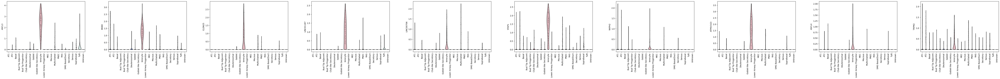

Lower Airway Progenitor : 
['SCGB3A2', 'TFF3', 'CYB5A', 'AGR2', 'FCGBP', 'HBA1', 'H3-3A', 'TMSB4X', 'CEL', 'H3-3B']

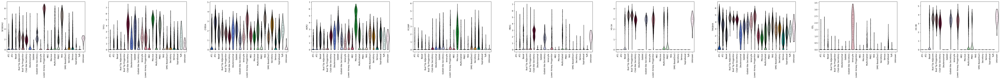

MEC : 
['SFRP1', 'LINC00844', 'MYLK', 'MEG3', 'KRT17', 'SLC26A10P', 'GALNT15', 'SYNM', 'CNN1', 'MOXD1']

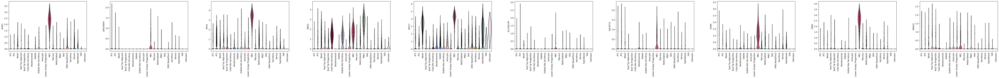

Mucous : 
['BPIFB2', 'MUC5B', 'CGREF1', 'CDC42EP5', 'NKX3-1', 'TCN1', 'PRR4', 'LINC00632', 'AP002498.1', 'TUSC8']

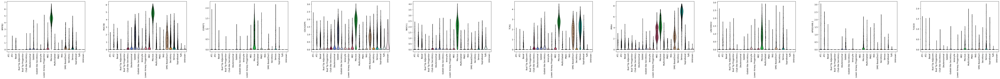

Multiciliated : 
['HOATZ', 'THBS3-AS1', 'TTC29', 'DYNLT2B', 'DNAI7', 'FOXJ1', 'LINC01732', 'MACROH2A1', 'CFAP20DC', 'CFAP52']

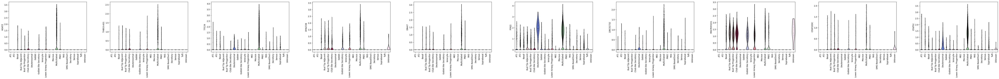

PNEC : 
['PCSK1N', 'GHRL', 'HEPACAM2', 'SCGN', 'BEX1', 'CHGA', 'SLC35D3', 'CELF3', 'RFX6', 'INSM1']

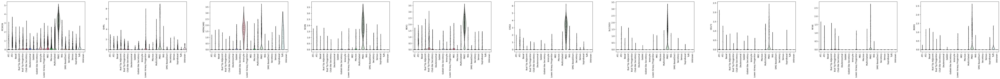

RAS : 
['SCGB3A2', 'MGP', 'RNASE1', 'SCGB3A1', 'PRSS2', 'SFTA2', 'SFTPB', 'SOX4', 'HHIP', 'SCGB1A1']

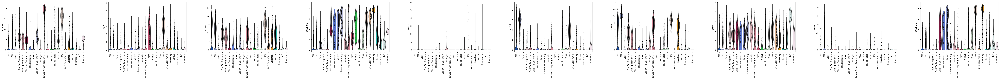

SMG Basal/Duct : 
['RARRES1', 'TCN1', 'DEFB1', 'MIA', 'KRT6B', 'C3', 'AGR2', 'NKAIN3-IT1', 'LTF', 'ANXA1']

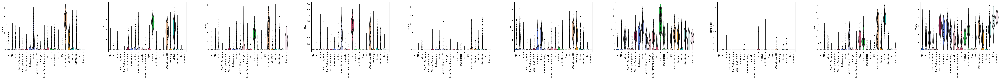

Secretory : 
['BPIFB1', 'SCGB1A1', 'SLPI', 'SCGB3A1', 'LCN2', 'SAA1', 'S100A6', 'TMEM45A', 'TSPAN8', 'LTF']

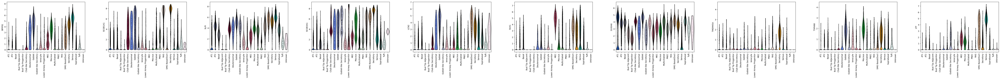

Serous : 
['PRR4', 'AC020656.1', 'PIP', 'PRB3', 'LYZ', 'C6orf58', 'LTF', 'ZG16B', 'AZGP1', 'DMBT1']

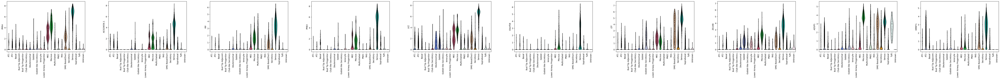

Suprabasal : 
['SERPINB3', 'S100A2', 'SERPINB1', 'SERPINB4', 'TSPAN1', 'TXN', 'KRT5', 'GSTP1', 'AQP3', 'CLDN7']

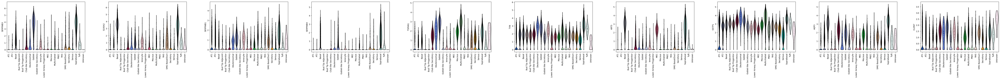

Tuft : 
['FOXI1', 'AL929472.2', 'LRMP', 'CRYM', 'GUCA1A', 'OVOL3', 'KIT', 'SLC26A4-AS1', 'HES6', 'GNG13']

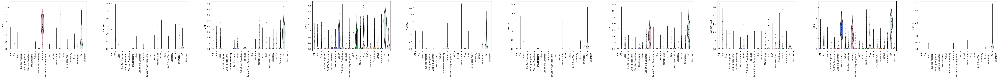

Unknown : 
['TMPRSS11B', 'IL36RN', 'MUC22', 'ESAM-AS1', 'ENSG00000262094', 'KRT78', 'MAL', 'CCDST', 'PRSS27', 'CALML3-AS1']

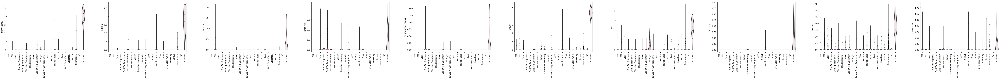

In [16]:
# Check expression of the three genes in the training set.
for celltype in model.cell_types: 
    print(celltype, ': ', markers_dict[celltype])
    sc.pl.violin(adata_lung, markers_dict[celltype], groupby='annotation', rotation=90)